In [6]:
import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

import folium 

import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [7]:
df=pd.read_csv("yelp_dataset_business.csv")

In [8]:
df.head()

,address,name,stars,longitude,postal_code,business_id,latitude,review_count,categories,city,is_open,hours,attributes,state
0,2818 E Camino Acequia Drive,Arizona Biltmore Golf Clu,3.0,-112.018481,85016,b'1SWheh84yJXfytovILXOAQ',33.522143,5,Golf|Active Life,Phoenix,0,NaN,GoodForKids@False,AZ
1,30 Eglinton Avenue W,Emerald Chinese Restaurant,2.5,-79.652289,L5R 3E7,b'QXAEGFB4oINsVuTFxEYKFQ',43.605499,128,Specialty Food|Restaurants|Dim Sum|Imported Fo...,Mississauga,1,Monday@9:0-0:0|Tuesday@9:0-0:0|Wednesday@9:0-0...,"RestaurantsReservations@True, GoodForMeal@dess...",ON
2,10110 Johnston Rd Ste 15,Musashi Japanese Restaurant,4.0,-80.859132,28210,b'gnKjwL_1w79qoiV3IC_xQQ',35.092564,170,Sushi Bars|Restaurants|Japanese,Charlotte,1,Monday@17:30-21:30|Wednesday@17:30-21:30|Thurs...,"GoodForKids@True, NoiseLevel@uaverage, Restaur...",NC
3,15655 W Roosevelt St Ste 237,Farmers Insurance - Paul Lorenz,5.0,-112.395596,85338,b'xvX2CttrVhyG2z1dFg_0xw',33.455613,3,Insurance|Financial Services,Goodyear,1,Monday@8:0-17:0|Tuesday@8:0-17:0|Wednesday@8:0...,NaN,AZ
4,4209 Stuart Andrew Blvd Ste F,Queen City Plumbing,4.0,-80.887223,28217,b'HhyxOkGAM07SRYtlQ4wMFQ',35.190012,4,Plumbing|Shopping|Local Services|Home Services...,Charlotte,1,Monday@7:0-23:0|Tuesday@7:0-23:0|Wednesday@7:0...,"BusinessAcceptsBitcoin@False, ByAppointmentOnl...",NC


In [9]:
# finding those restaurnts who has no name

In [10]:
df.shape

(192609, 14)

In [11]:
df['Restaurants']=df['categories'].str.contains('Restaurants')

In [12]:
df.head(3)

,address,name,stars,longitude,postal_code,business_id,latitude,review_count,categories,city,is_open,hours,attributes,state,Restaurants
0,2818 E Camino Acequia Drive,Arizona Biltmore Golf Clu,3.0,-112.018481,85016,b'1SWheh84yJXfytovILXOAQ',33.522143,5,Golf|Active Life,Phoenix,0,NaN,GoodForKids@False,AZ,False
1,30 Eglinton Avenue W,Emerald Chinese Restaurant,2.5,-79.652289,L5R 3E7,b'QXAEGFB4oINsVuTFxEYKFQ',43.605499,128,Specialty Food|Restaurants|Dim Sum|Imported Fo...,Mississauga,1,Monday@9:0-0:0|Tuesday@9:0-0:0|Wednesday@9:0-0...,"RestaurantsReservations@True, GoodForMeal@dess...",ON,True
2,10110 Johnston Rd Ste 15,Musashi Japanese Restaurant,4.0,-80.859132,28210,b'gnKjwL_1w79qoiV3IC_xQQ',35.092564,170,Sushi Bars|Restaurants|Japanese,Charlotte,1,Monday@17:30-21:30|Wednesday@17:30-21:30|Thurs...,"GoodForKids@True, NoiseLevel@uaverage, Restaur...",NC,True


In [13]:
df_restaurants=df.loc[df.Restaurants==True]

In [14]:
df_restaurants.head()

,address,name,stars,longitude,postal_code,business_id,latitude,review_count,categories,city,is_open,hours,attributes,state,Restaurants
1,30 Eglinton Avenue W,Emerald Chinese Restaurant,2.5,-79.652289,L5R 3E7,b'QXAEGFB4oINsVuTFxEYKFQ',43.605499,128,Specialty Food|Restaurants|Dim Sum|Imported Fo...,Mississauga,1,Monday@9:0-0:0|Tuesday@9:0-0:0|Wednesday@9:0-0...,"RestaurantsReservations@True, GoodForMeal@dess...",ON,True
2,10110 Johnston Rd Ste 15,Musashi Japanese Restaurant,4.0,-80.859132,28210,b'gnKjwL_1w79qoiV3IC_xQQ',35.092564,170,Sushi Bars|Restaurants|Japanese,Charlotte,1,Monday@17:30-21:30|Wednesday@17:30-21:30|Thurs...,"GoodForKids@True, NoiseLevel@uaverage, Restaur...",NC,True
11,2450 E Indian School Rd,Taco Bell,3.0,-112.028588,85016,b'1Dfx3zM-rW4n-31KeC8sJg',33.495194,18,Restaurants|Breakfast & Brunch|Mexican|Tacos|T...,Phoenix,1,Monday@7:0-0:0|Tuesday@7:0-0:0|Wednesday@7:0-0...,"RestaurantsTakeOut@True, BusinessParking@garag...",AZ,True
13,5981 Andrews Rd,Marcos Pizza,4.0,-81.359556,44060,b'fweCYi8FmbJXHCqLnwuk8w',41.708520,16,Italian|Restaurants|Pizza|Chicken Wings,Mentor-on-the-Lake,1,Monday@10:0-0:0|Tuesday@10:0-0:0|Wednesday@10:...,"RestaurantsPriceRange2@2, BusinessAcceptsCredi...",OH,True
17,1775 E Tropicana Ave Ste 29,Carluccios Tivoli Gardens,4.0,-115.128529,89119,b'PZ-LZzSlhSe9utkQYU8pFg',36.100016,40,Restaurants|Italian,Las Vegas,0,NaN,"OutdoorSeating@False, BusinessAcceptsCreditCar...",NV,True


In [15]:
df_restaurants.shape

(59371, 15)

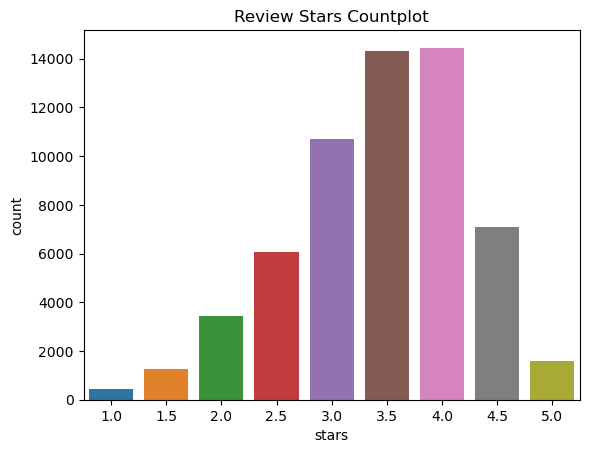

In [16]:
sns.countplot(x=df_restaurants["stars"])
plt.title("Review Stars Countplot")

plt.show()

In [17]:
top_restaurants=df_restaurants.sort_values(by=['review_count', 'stars'], ascending=False)[:20]

In [18]:
top_restaurants.head()

,address,name,stars,longitude,postal_code,business_id,latitude,review_count,categories,city,is_open,hours,attributes,state,Restaurants
82250,3655 Las Vegas Blvd S,Mon Ami Gabi,4.0,-115.172434,89109,b'4JNXUYY8wbaaDmk3BPzlWw',36.112859,8348,Food|French|Breakfast & Brunch|Restaurants|Ste...,Las Vegas,1,Monday@7:0-23:0|Tuesday@7:0-23:0|Wednesday@7:0...,"Corkage@True, RestaurantsDelivery@False, Outdo...",NV,True
89206,3570 S Las Vegas Blvd,Bacchanal Buffet,4.0,-115.176222,89109,b'RESDUcs7fIiihp38-d6_6g',36.116113,8339,Restaurants|Buffets|Sandwiches|Food|Breakfast ...,Las Vegas,1,Monday@7:30-22:0|Tuesday@7:30-22:0|Wednesday@7...,"NoiseLevel@uaverage, HasTV@False, BikeParking@...",NV,True
35199,3708 Las Vegas Blvd S,Wicked Spoon,3.5,-115.176155,89109,b'K7lWdNUhCbcnEvI0NhGewg',36.109550,6708,Buffets|Breakfast & Brunch|Restaurants,Las Vegas,1,Monday@8:0-21:0|Tuesday@8:0-21:0|Wednesday@8:0...,"GoodForKids@True, RestaurantsPriceRange2@3, Re...",NV,True
58852,3535 Las Vegas Blvd,Hash House A Go Go,4.0,-115.171580,89109,b'f4x1YBxkLrZg652xt2KR5g',36.118181,5763,Breakfast & Brunch|Food|Restaurants|American (...,Las Vegas,1,Monday@0:0-0:0|Tuesday@0:0-0:0|Wednesday@0:0-0...,"BusinessAcceptsCreditCards@True, RestaurantsPr...",NV,True
141820,3667 Las Vegas Blvd S,Gordon Ramsay BurGR,4.0,-115.172169,89109,b'cYwJA2A6I12KNkm2rtXd5g',36.110724,5484,Restaurants|Burgers|American (Traditional),Las Vegas,0,Monday@11:0-0:0|Tuesday@11:0-0:0|Wednesday@11:...,"RestaurantsGoodForGroups@True, Alcohol@ufull_b...",NV,True


In [19]:
top_restaurants.isnull().sum()

address         0
name            0
stars           0
longitude       0
postal_code     0
business_id     0
latitude        0
review_count    0
categories      0
city            0
is_open         0
hours           0
attributes      0
state           0
Restaurants     0
dtype: int64

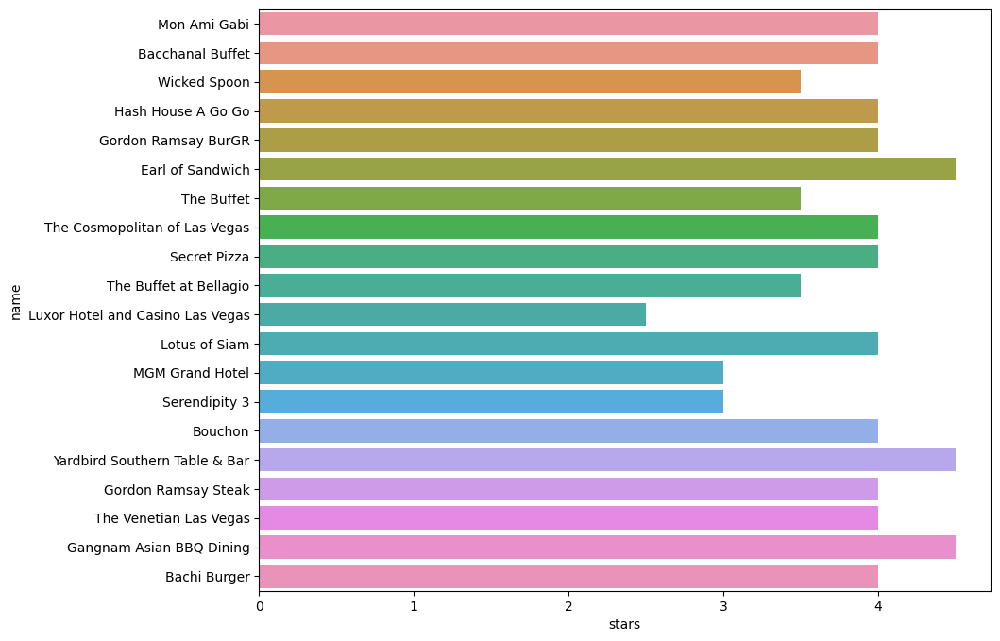

In [20]:
fig,ax=plt.subplots(figsize=(10,8))
sns.barplot(x='stars' , y='name', data=top_restaurants, ax=ax)
plt.show()

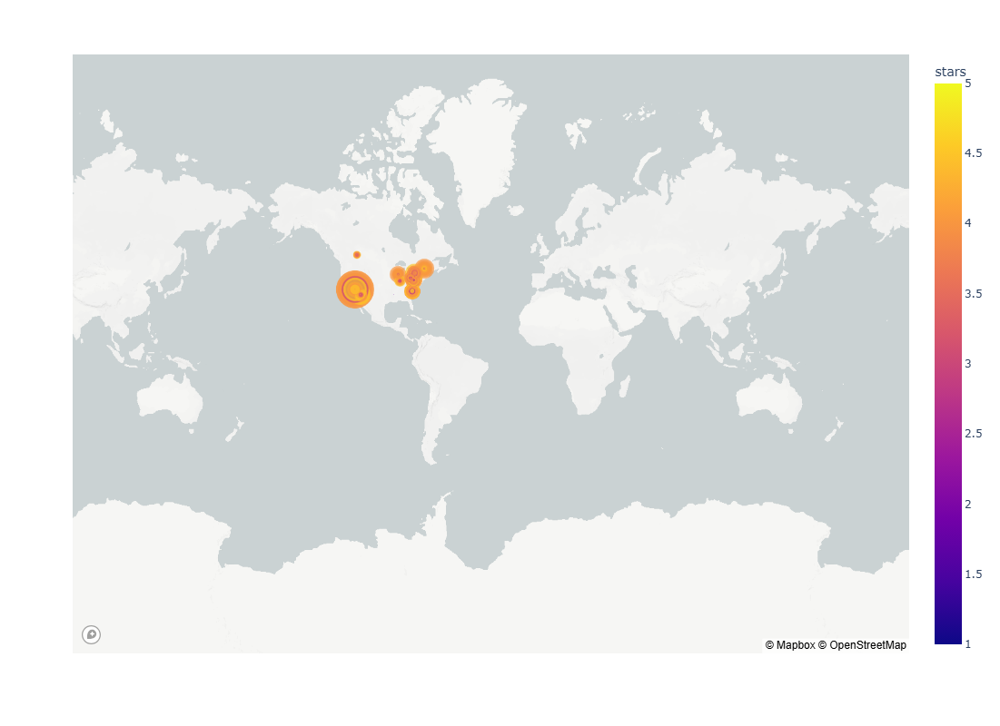

In [21]:
px.set_mapbox_access_token("pk.eyJ1IjoidmlqYXlrdW1hcmphbmdhbGdpIiwiYSI6ImNseHk4NjFocjAxcmwyaXF5cGU4a3h0N2MifQ.mYtPo49tWdlmNmEzG6yf9g")
#configuration_plotly_browser_state()
px.scatter_mapbox(df_restaurants, lat="latitude", lon="longitude", color="stars", size="review_count", size_max=30, zoom=3, height=800)


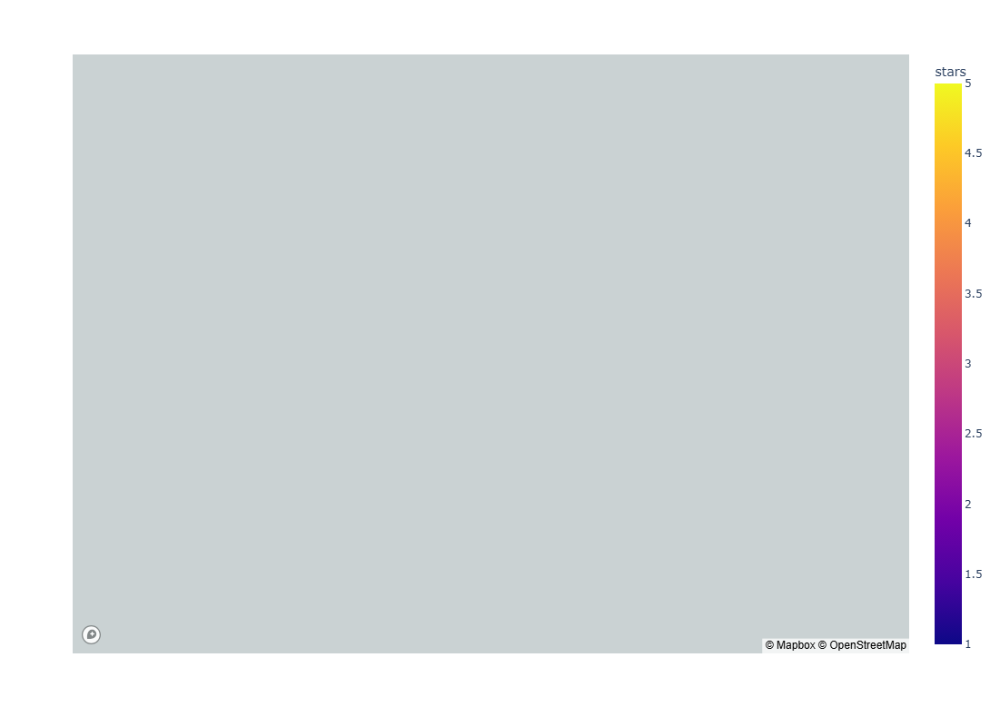

In [22]:
lasVegas=df_restaurants[df_restaurants.state=='NV']
px.scatter_mapbox(lasVegas, lat="latitude",lon="longitude", color="stars", size="review_count",size_max=15, zoom=10, width=1200, height=800)

## Building the Model

##### Determining the number of clusters(k)

#Elbow method to determine the number of k in kmeans clusters

In [23]:

coords=lasVegas[['longitude', 'latitude']]

distortions=[]
K=range(1,25)
for k in K:
    kmeansModel=KMeans(n_clusters=k)
    kmeansModel=kmeansModel.fit(coords)
    distortions.append(kmeansModel.inertia_)


    

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarni

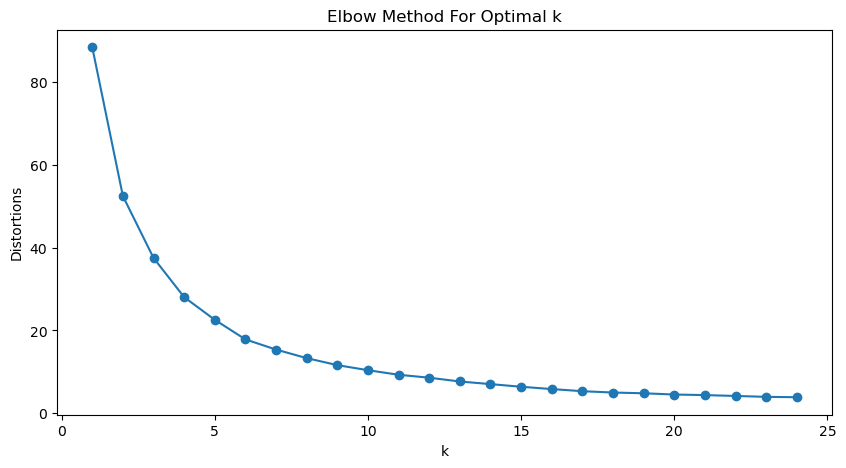

In [24]:
fig,ax=plt.subplots(figsize=(10,5))
plt.plot(K, distortions, marker='o')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Elbow Method For Optimal k')
plt.show()


### Silhoute method

In [38]:
from sklearn.metrics import silhouette_score

In [39]:
sil=[]

In [31]:
kmax=50

In [32]:
#dissimilarity would not be defined for a single cluster,, thus minimum number of clusters should be 2

In [35]:
for k in range(2,kmax+1):
  kmeans=KMeans(n_clusters=k).fit(coords)
  labels=kmeans.labels_
  sil.append(silhouette_score(coords, labels, metric='euclidean'))

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarni

In [36]:
sil

[0.38400973343054734,
 0.36664853849735984,
 0.39460684925568473,
 0.38892857727358077,
 0.4071635320861837,
 0.4190205624309618,
 0.42504895401819853,
 0.40509901059276143,
 0.40945089218620595,
 0.4203255829224932,
 0.42389208364502146,
 0.43211833310416614,
 0.42138009869430804,
 0.4375589643149027,
 0.44403474498262124,
 0.44108795832221886,
 0.44441902172074155,
 0.4349607394699301,
 0.4387121141031851,
 0.45059568422641294,
 0.4279408954911941,
 0.4315739695575112,
 0.4306000831960445,
 0.43785858017345053,
 0.4147025192249639,
 0.43368683523346585,
 0.4266967832913551,
 0.4385025599104998,
 0.44488289468613557,
 0.4479322076719466,
 0.44662174409222877,
 0.4283481706791781,
 0.4399425601840499,
 0.44214070041765025,
 0.43747145225077805,
 0.43635019202969655,
 0.4371141204325458,
 0.44381680607353247,
 0.42988084573287594,
 0.44187549278405686,
 0.4484457140153706,
 0.44819753847001065,
 0.4464268376985888,
 0.44963194011978236,
 0.4550890488301491,
 0.44466550294737966,
 0.4555

In [ ]:
#from anyalysis of both method k=5 is best option

## K-MEAN Clustering

In [45]:
kmeans=KMeans(n_clusters=50, init='k-means++')
kmeans.fit(coords)
y=kmeans.labels_

print("k=5", "silhouette_score:", silhouette_score(coords, y, metric='euclidean'))





C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



k=5 silhouette_score: 0.450156898322332


In [43]:
# k=5 is not the best values becos score is0.38 but in above array it is high

In [46]:
# by hit and trial we get max score where k=23

## prediction

In [49]:
lasVegas['cluster']=kmeans.predict(lasVegas[['longitude', 'latitude']])

C:\Users\Vijay Kumar\AppData\Local\Temp\ipykernel_4672\2798204869.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [50]:
lasVegas.head()

,address,name,stars,longitude,postal_code,business_id,latitude,review_count,categories,city,is_open,hours,attributes,state,Restaurants,cluster
17,1775 E Tropicana Ave Ste 29,Carluccios Tivoli Gardens,4.0,-115.128529,89119,b'PZ-LZzSlhSe9utkQYU8pFg',36.100016,40,Restaurants|Italian,Las Vegas,0,NaN,"OutdoorSeating@False, BusinessAcceptsCreditCar...",NV,True,49
25,6055 E Lake Mead Blvd,Marias Mexican Restaurant & Bakery,4.5,-115.040529,89156,b'tstimHoMcYbkSC4eBA1wEg',36.195615,184,Mexican|Restaurants|Patisserie/Cake Shop|Food|...,Las Vegas,1,Monday@11:0-21:0|Tuesday@10:0-21:0|Wednesday@1...,"BikeParking@True, BusinessParking@garage@False...",NV,True,12
75,6125 Spring Mountain Rd,Dairy Queen,2.0,-115.225620,89146,b'kANF0dbeoW34s2vwh6Umfw',36.125031,33,Fast Food|Food|Restaurants|Ice Cream & Frozen ...,Las Vegas,0,NaN,"RestaurantsPriceRange2@1, Ambience@romantic@Fa...",NV,True,0
111,4343 N Rancho Dr,Imperial Asian Buffet,2.0,-115.233331,89030,b'X8mtoSxY8whtmbDlj0D3Aw',36.238596,4,Restaurants|Chinese,Las Vegas,1,NaN,NaN,NV,True,33
135,Artisan Hotel 1501 W Sahara Ave,Artisan Fine Dining Room,2.0,-115.169792,89102,b'bJP4l_BGq2CudEu0m-wNjg',36.143672,3,Restaurants|Pizza|Italian|American (New),Las Vegas,0,Monday@16:0-0:0|Tuesday@16:0-0:0|Wednesday@16:...,"RestaurantsAttire@dressy, Corkage@True, Restau...",NV,True,19


In [ ]:
#example

In [53]:
#MAP BASED ON CLUSTERS

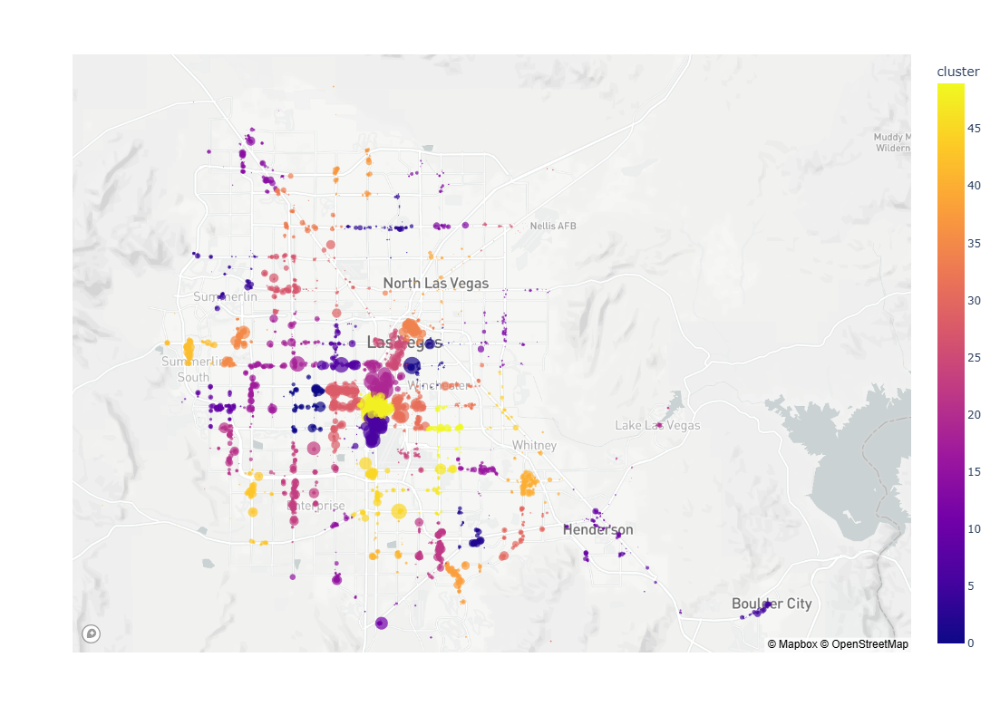

In [55]:
px.scatter_mapbox(lasVegas, lat="latitude", lon="longitude", color="cluster", size="review_count",

                  hover_data=['name', 'latitude','longitude'], zoom=10, width=1200, height=800)

## Location Based RECOMMENDATION 

In [57]:
top_restaurants_lasVegas=lasVegas.sort_values(by=['review_count', 'stars'],ascending=False)

In [58]:
top_restaurants_lasVegas

,address,name,stars,longitude,postal_code,business_id,latitude,review_count,categories,city,is_open,hours,attributes,state,Restaurants,cluster
82250,3655 Las Vegas Blvd S,Mon Ami Gabi,4.0,-115.172434,89109,b'4JNXUYY8wbaaDmk3BPzlWw',36.112859,8348,Food|French|Breakfast & Brunch|Restaurants|Ste...,Las Vegas,1,Monday@7:0-23:0|Tuesday@7:0-23:0|Wednesday@7:0...,"Corkage@True, RestaurantsDelivery@False, Outdo...",NV,True,48
89206,3570 S Las Vegas Blvd,Bacchanal Buffet,4.0,-115.176222,89109,b'RESDUcs7fIiihp38-d6_6g',36.116113,8339,Restaurants|Buffets|Sandwiches|Food|Breakfast ...,Las Vegas,1,Monday@7:30-22:0|Tuesday@7:30-22:0|Wednesday@7...,"NoiseLevel@uaverage, HasTV@False, BikeParking@...",NV,True,48
35199,3708 Las Vegas Blvd S,Wicked Spoon,3.5,-115.176155,89109,b'K7lWdNUhCbcnEvI0NhGewg',36.109550,6708,Buffets|Breakfast & Brunch|Restaurants,Las Vegas,1,Monday@8:0-21:0|Tuesday@8:0-21:0|Wednesday@8:0...,"GoodForKids@True, RestaurantsPriceRange2@3, Re...",NV,True,48
58852,3535 Las Vegas Blvd,Hash House A Go Go,4.0,-115.171580,89109,b'f4x1YBxkLrZg652xt2KR5g',36.118181,5763,Breakfast & Brunch|Food|Restaurants|American (...,Las Vegas,1,Monday@0:0-0:0|Tuesday@0:0-0:0|Wednesday@0:0-0...,"BusinessAcceptsCreditCards@True, RestaurantsPr...",NV,True,48
141820,3667 Las Vegas Blvd S,Gordon Ramsay BurGR,4.0,-115.172169,89109,b'cYwJA2A6I12KNkm2rtXd5g',36.110724,5484,Restaurants|Burgers|American (Traditional),Las Vegas,0,Monday@11:0-0:0|Tuesday@11:0-0:0|Wednesday@11:...,"RestaurantsGoodForGroups@True, Alcohol@ufull_b...",NV,True,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51743,5080 E Bonanza Rd,Carls Jr.,1.0,-115.063048,89110,b'jtQqg_96doTihYzLCC3x3A',36.174373,3,Fast Food|Restaurants,Las Vegas,1,NaN,NaN,NV,True,12
76321,4001 W Sahara Ave,Wienerschnitzel,1.0,-115.194348,89102,b'45IHzSJj49HJn32G3j6H_A',36.144081,3,Fast Food|American (New)|Restaurants,Las Vegas,0,NaN,NaN,NV,True,7
81305,3150 Paradise Rd,Sbarro,1.0,-115.151119,89109,b'rvxpYoiNldD6R9kwXoC7Rg',36.131128,3,Pizza|Italian|Restaurants,Las Vegas,0,Monday@9:0-17:0|Tuesday@9:0-17:0|Wednesday@9:0...,"RestaurantsGoodForGroups@False, RestaurantsDel...",NV,True,19
140045,8556 Blue Diamond Rd,KFC,1.0,-115.277796,89178,b'i8K4qY1VA13eWRQ_zbmuTw',36.020876,3,Restaurants|Fast Food,Las Vegas,0,NaN,NaN,NV,True,43


In [65]:
def recommend_restaurants(df,longitude,latitude):
    #predict the cluster for longitude and latitude provided
    cluster=kmeans.predict(np.array([longitude,latitude]).reshape(1,-1))[0]
    print(cluster)
    #Get the best restaurant in this cluster
    return df[df['cluster']==cluster].iloc[0:5][['name', 'latitude','longitude','stars']]



    

In [69]:
recommend_restaurants(top_restaurants_lasVegas, -115.1891691, 36.1017316)

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



6


,name,latitude,longitude,stars
173993,Luxor Hotel and Casino Las Vegas,36.097341,-115.176339,2.5
162905,MGM Grand Hotel,36.102251,-115.169968,3.0
113838,Mandalay Bay Resort & Casino,36.091895,-115.175256,3.0
150751,Shake Shack,36.103061,-115.173450,4.0
149294,Burger Bar,36.094244,-115.176178,4.0


In [67]:
recommend_restaurants(top_restaurants_lasVegas, -115.2798544, 36.0842838)

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



21


,name,latitude,longitude,stars
11169,Juans Flaming Fajitas & Cantina,36.100509,-115.302689,4.5
120178,DW Bistro,36.084293,-115.293878,4.5
63907,Jjanga Steak & Sushi,36.076449,-115.298621,4.5
154748,Panna Thai Restaurant,36.078936,-115.298552,4.0
62703,Pinches Tacos,36.084289,-115.293388,3.5


In [70]:
recommend_restaurants(top_restaurants_lasVegas, -115.082821, 36.155011)

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



12


,name,latitude,longitude,stars
151427,Golden Corral,36.155011,-115.082821,3.0
50462,Oh Curry,36.165906,-115.063124,4.5
49904,Fat Boy,36.167044,-115.080106,4.5
105572,Thai Cuisine,36.174482,-115.063816,4.0
25,Marias Mexican Restaurant & Bakery,36.195615,-115.040529,4.5


In [73]:
test_coordinates={
    'user':[1,2,3],
    'latitude':[36.1017316, 36.0842838, 36.155011],
    'longitude':[-115.1891691, -115.2798544, -115.082821],
}
test_df=pd.DataFrame(test_coordinates)

test_df

,user,latitude,longitude
0,1,36.101732,-115.189169
1,2,36.084284,-115.279854
2,3,36.155011,-115.082821


In [74]:
user1=test_df[test_df['user']==1]

user1

,user,latitude,longitude
0,1,36.101732,-115.189169


In [75]:
#plotting map where , it will show the location of person and nearby restaurants through scatterplot

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



6


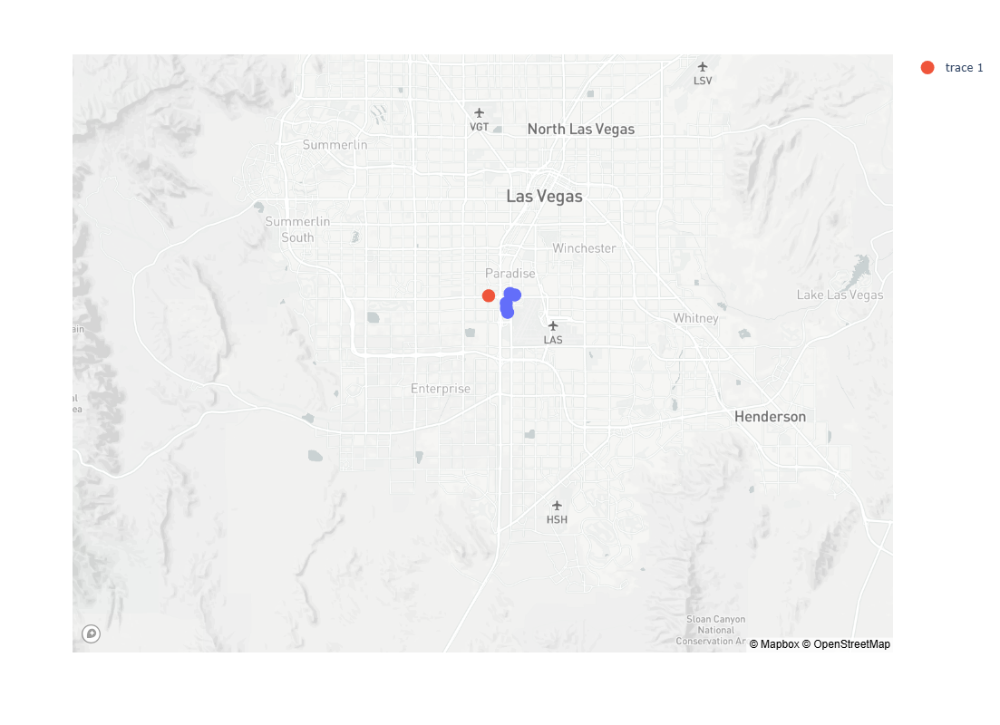

In [80]:
fig=px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user1.longitude, user1.latitude), lat='latitude', lon='longitude',
zoom=10, width=1200, height=800, hover_data=['name','latitude','longitude','stars'])

fig.add_scattermapbox(lat=user1["latitude"],lon=user1["longitude"]).update_traces(dict(mode='markers',marker=dict(size=15)))

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



6


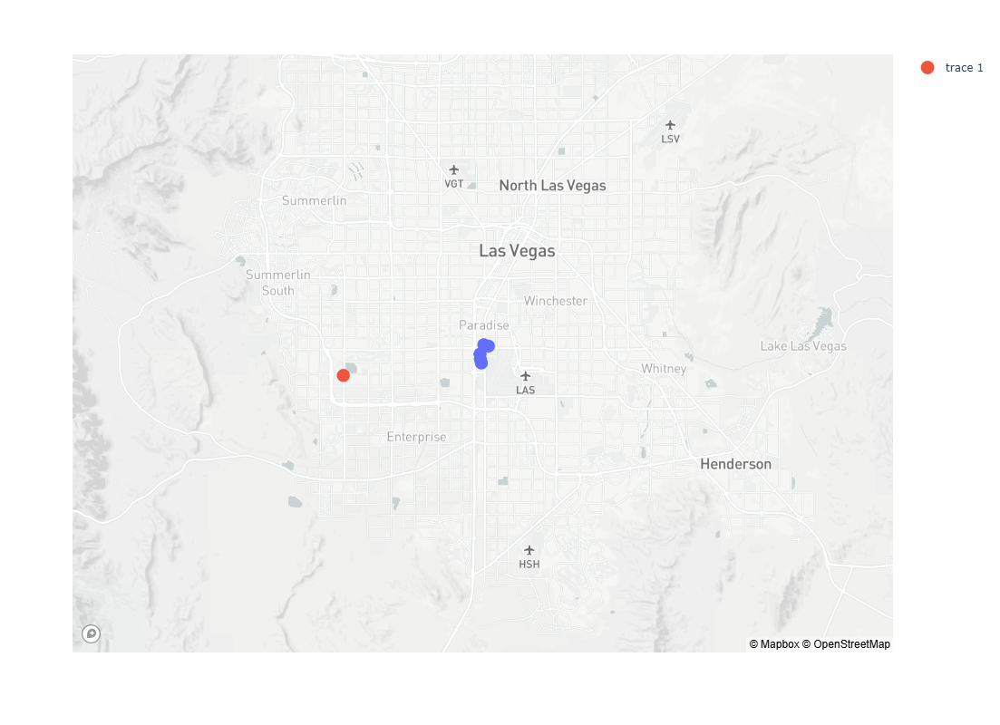

In [81]:
user2=test_df[test_df['user']==2].reset_index()
fig=px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user1.longitude, user2.latitude), lat='latitude', lon='longitude',
zoom=10, width=1200, height=800, hover_data=['name','latitude','longitude','stars'])

fig.add_scattermapbox(lat=user2["latitude"],lon=user2["longitude"]).update_traces(dict(mode='markers',marker=dict(size=15)))

C:\Users\Vijay Kumar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



12


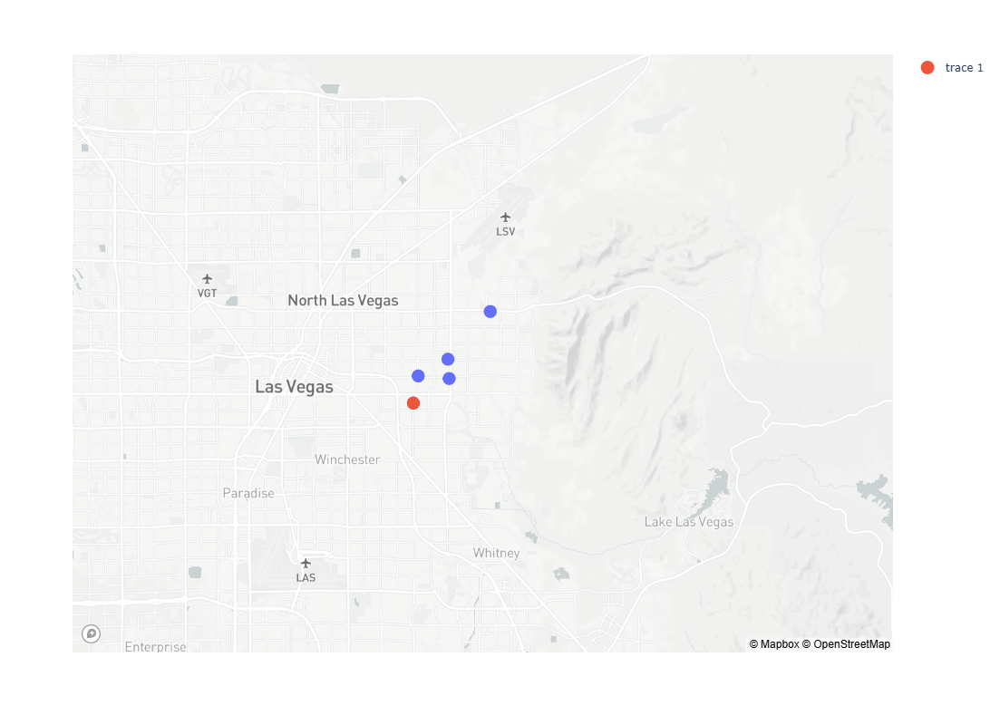

In [82]:
user3=test_df[test_df['user']==3].reset_index()
fig=px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user3.longitude, user3.latitude), lat='latitude', lon='longitude',
zoom=10, width=1200, height=800, hover_data=['name','latitude','longitude','stars'])

fig.add_scattermapbox(lat=user3["latitude"],lon=user3["longitude"]).update_traces(dict(mode='markers',marker=dict(size=15)))